In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

In [3]:
from tensorflow import keras

import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
import numpy as np
import imageio
import cv2
import os

DATA VISUATION

In [9]:
DATA_FOLDER = "../../dataset"
TRAIN_FOLDER = "Train"
TEST_FOLDER = "Test"

In [7]:
print(f"Dataset Length: {len(os.listdir(DATA_FOLDER))}")

Dataset Length: 2484


In [8]:
import os
import shutil
import random

# Define paths
dataset_folder = '../../dataset'  # Path to the folder containing all MP4 files
train_folder = '../../dataset/Train'  # Path to the training folder
test_folder = '../../dataset/Test'    # Path to the testing folder

# Ensure the train and test folders exist
os.makedirs(train_folder, exist_ok=True)
os.makedirs(test_folder, exist_ok=True)

# List all MP4 files in the dataset folder
all_files = [f for f in os.listdir(dataset_folder) if f.endswith('.mp4')]

# Shuffle the list to ensure randomness
random.shuffle(all_files)

# Determine split points
total_files = len(all_files)
train_count = 2000
test_count = total_files - train_count

# Split the list into training and testing sets
train_files = all_files[:train_count]
test_files = all_files[train_count:]

# Move files to the respective folders
for file in train_files:
    shutil.move(os.path.join(dataset_folder, file), os.path.join(train_folder, file))

for file in test_files:
    shutil.move(os.path.join(dataset_folder, file), os.path.join(test_folder, file))

print(f"Training set: {len(train_files)} files")
print(f"Testing set: {len(test_files)} files")


Training set: 2000 files
Testing set: 483 files


In [12]:
train_metadata = pd.read_json(os.path.join(DATA_FOLDER,"metadata.json")).T
train_metadata.head()

,label,split,original
syybbzdttf.mp4,FAKE,train,gmkfzogjlj.mp4
ibyevudtta.mp4,FAKE,train,xfrswzqrmn.mp4
cwhvshlzzh.mp4,FAKE,train,yklrylijjp.mp4
wcjvgqhaup.mp4,FAKE,train,omodwoqqhv.mp4
hwklwhlahc.mp4,FAKE,train,ouvlzfmqsz.mp4


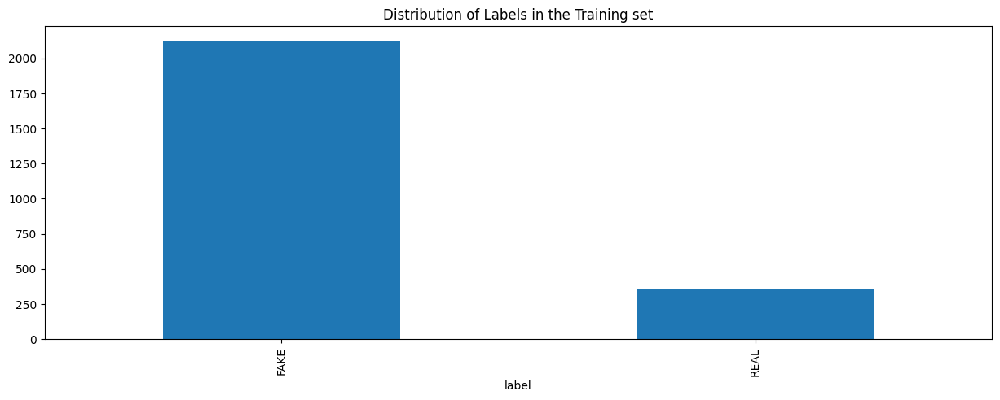

In [13]:
train_metadata.groupby('label')['label'].count().plot(figsize=(15, 5),kind='bar',title="Distribution of Labels in the Training set")
plt.show()

In [14]:
train_metadata.shape

(2483, 3)

VISUALIZE FAKE VIDEOS

In [15]:
fake_train_video=list(train_metadata.loc[train_metadata.label=="FAKE"].sample(10).index)
fake_train_video

['agldheqnhf.mp4',
 'nmjaxebwee.mp4',
 'qlsvdhmqqt.mp4',
 'gklxjvzirw.mp4',
 'dtjnasdyyy.mp4',
 'ophdpgowiq.mp4',
 'zmetpwttnz.mp4',
 'ropvlealpl.mp4',
 'ykvbsndwvl.mp4',
 'dhvtqqczev.mp4']

In [18]:
def display_image_from_video(video_path):
    capture_image = cv2.VideoCapture(video_path)
    if not capture_image.isOpened():
        print(f"Error opening video file: {video_path}")
        return
    
    ret, frame = capture_image.read()
    if not ret:
        print(f"Error reading frame from video file: {video_path}")
        return
    
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    ax.imshow(frame)
    plt.show()
    capture_image.release()

Error opening video file: ../../dataset\Train\agldheqnhf.mp4
Error opening video file: ../../dataset\Train\nmjaxebwee.mp4


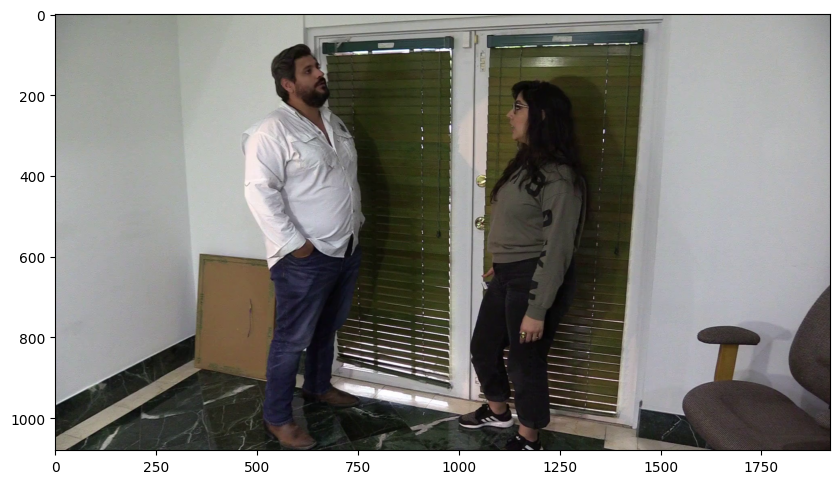

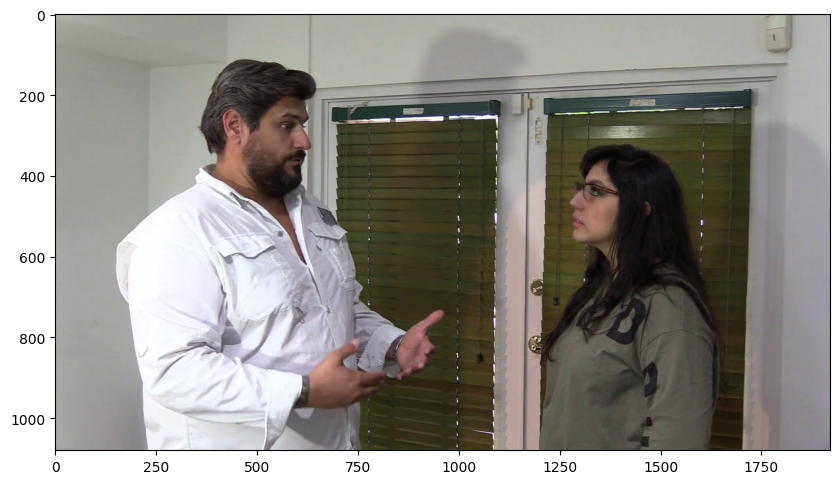

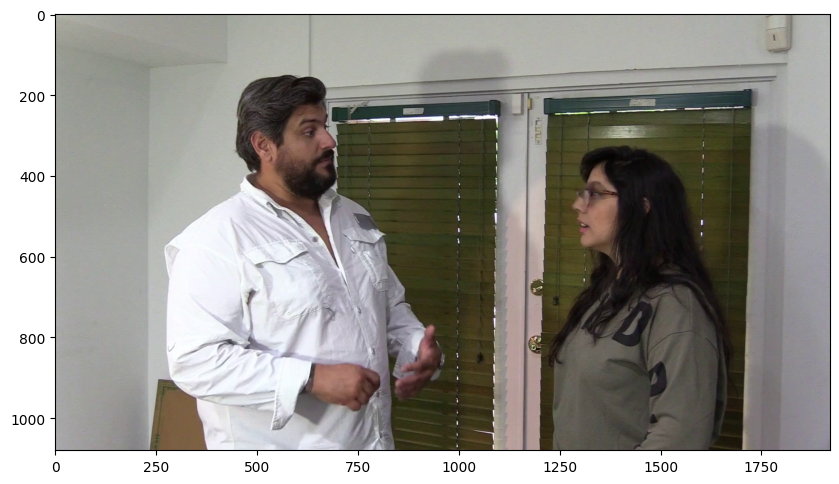

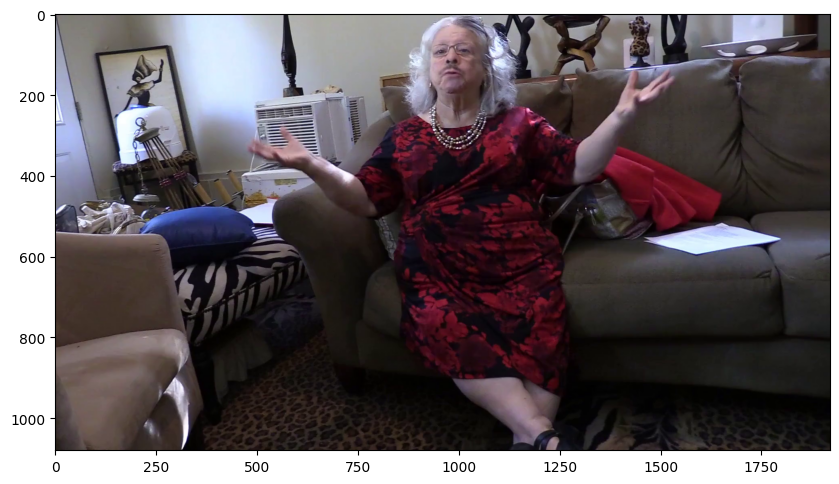

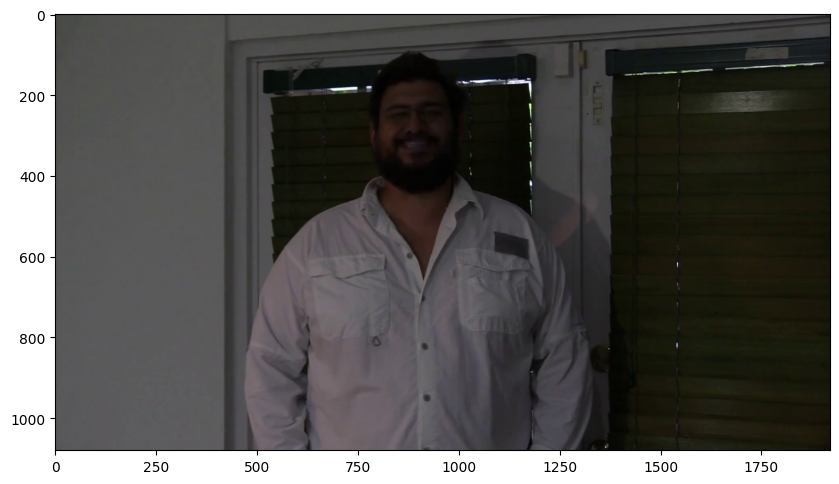

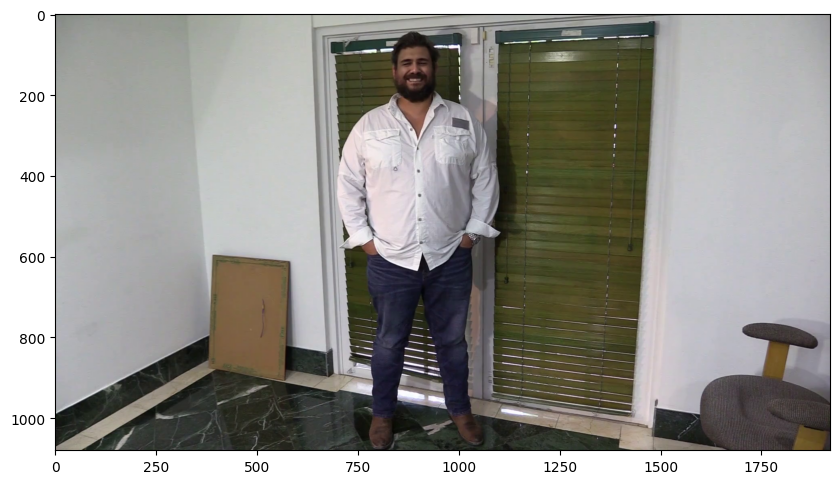

Error opening video file: ../../dataset\Train\ykvbsndwvl.mp4


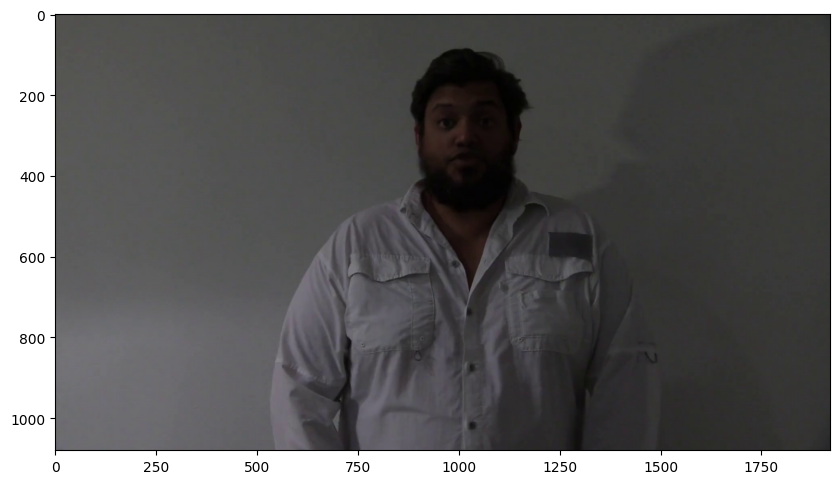

In [19]:
for video_file in fake_train_video:
    display_image_from_video(os.path.join(DATA_FOLDER, TRAIN_FOLDER, video_file))

FEW REAL IMAGES

In [21]:
real_train_video = list(train_metadata.loc[train_metadata.label=='REAL'].sample(5).index)
real_train_video

['fjwfpdibhh.mp4',
 'giqncczwue.mp4',
 'bgqnopotbe.mp4',
 'hgqqwuqrlm.mp4',
 'osqruujwxd.mp4']

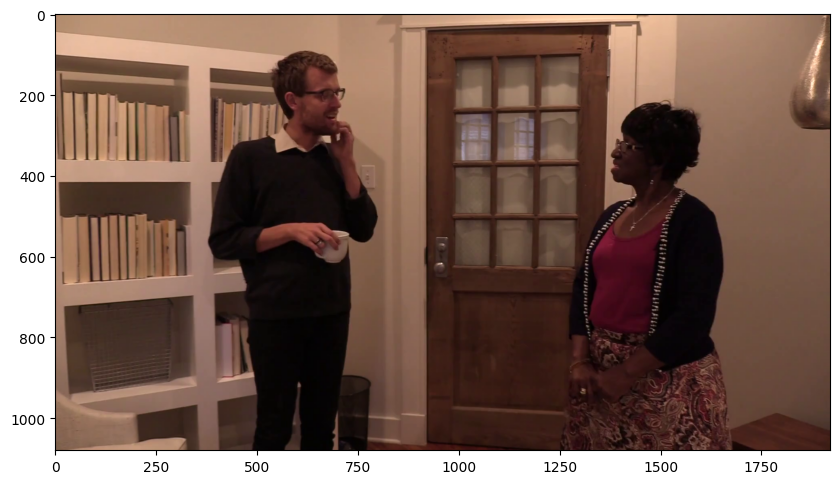

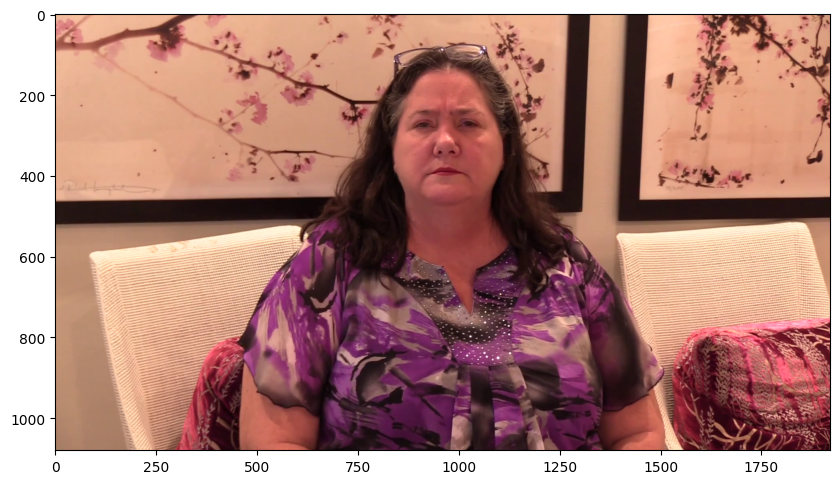

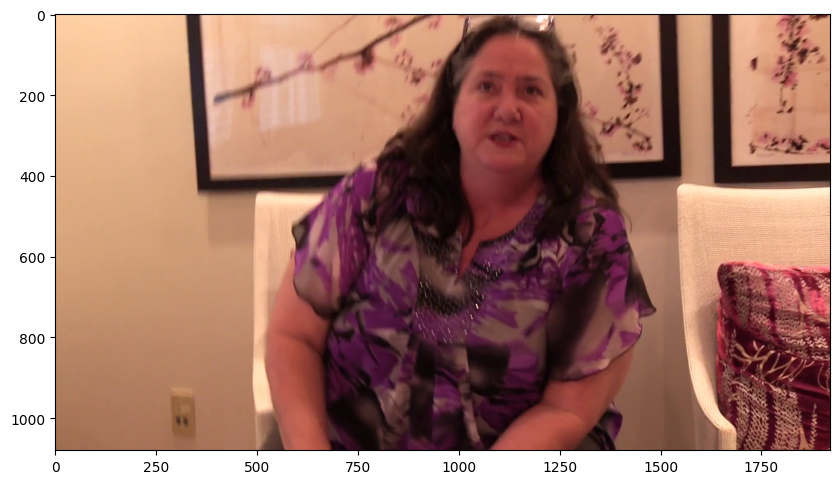

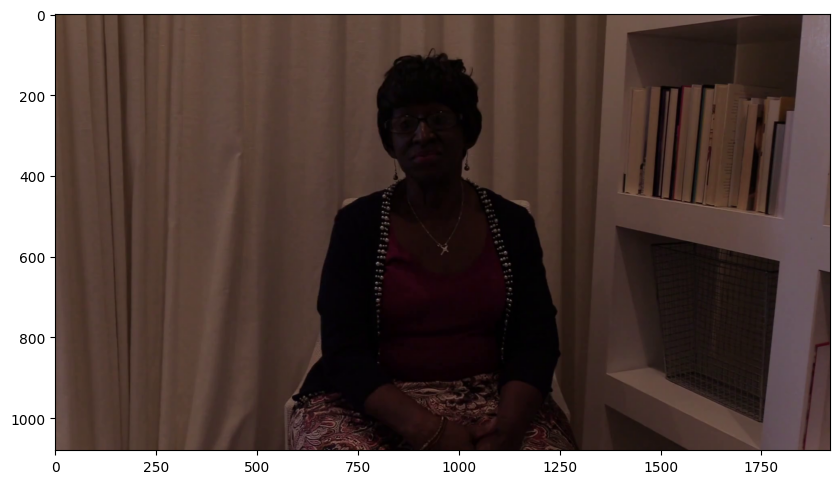

Error opening video file: ../../dataset\Train\osqruujwxd.mp4


In [22]:
for video_file in real_train_video:
    display_image_from_video(os.path.join(DATA_FOLDER, TRAIN_FOLDER, video_file))

In [23]:
train_metadata['original'].value_counts()[0:5]

original
rplxcgcmaq.mp4    28
fsywibkykv.mp4    28
krifcuqyay.mp4    28
zwrulgwqve.mp4    28
ywqgpzqnpl.mp4    28
Name: count, dtype: int64

Modifing Visualization function to work with multiple images

In [24]:
def display_image_from_video_list(video_path_list,video_folder=TRAIN_FOLDER):
    plt.figure()
    fig, ax = plt.subplots(2,3,figsize=(16,8))

    for i, video_file in enumerate(video_path_list[0:6]):
        video_path = os.path.join(DATA_FOLDER, video_folder, video_file)
        capture_image = cv2.VideoCapture(video_path)
        ret, frame = capture_image.read()
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        ax[i//3, i%3].imshow(frame)
        ax[i//3, i%3].set_title(f"video: {video_file}")
        ax[i//3, i%3].axis('on')

<Figure size 640x480 with 0 Axes>

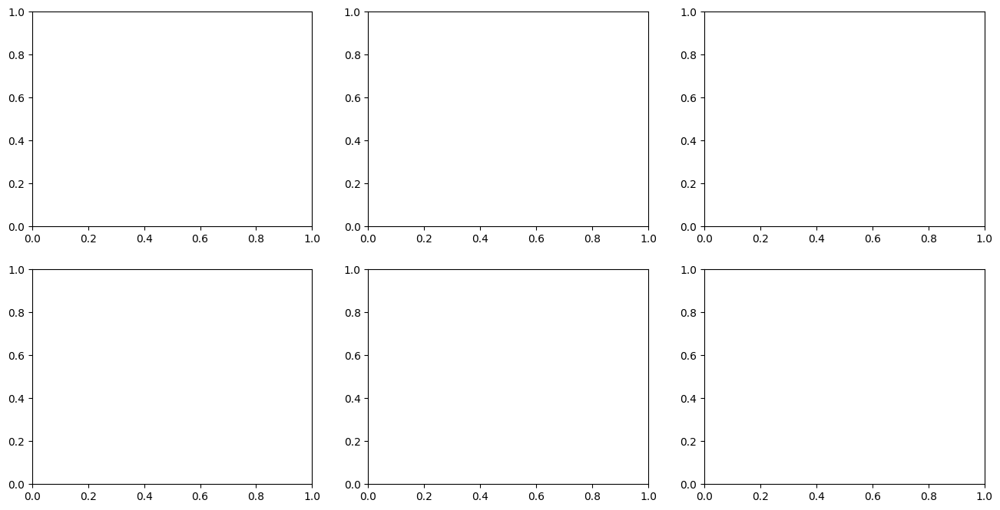

In [26]:
same_original_fake_train_video = list(train_metadata.loc[train_metadata.original == "qlsvdhmqqt.mp4"].index)
display_image_from_video_list(same_original_fake_train_video)

TEST VIDEO FILES

In [27]:
test_videos = pd.DataFrame(list(os.listdir(os.path.join(DATA_FOLDER,TEST_FOLDER))), columns=['video'])

In [28]:
test_videos.head()

,video
0,aabqyygbaa.mp4
1,aansscoqsl.mp4
2,aawhvztjdt.mp4
3,aciecilrsg.mp4
4,adwtqjusqx.mp4


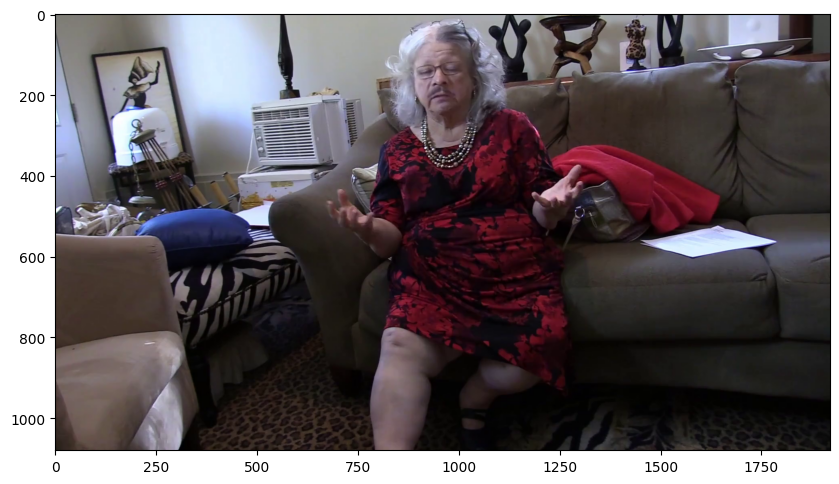

In [29]:
display_image_from_video(os.path.join(DATA_FOLDER,TEST_FOLDER,test_videos.iloc[2].video))

PLAY VIDEO FILES

FEW FAKE VIDEOS

In [31]:
fake_videos = list(train_metadata.loc[train_metadata.label=="FAKE"].index)

In [32]:
from IPython.display import HTML
from base64 import b64encode

def play_video(video_file,subset=TRAIN_FOLDER):
    video_url = open(os.path.join(DATA_FOLDER,subset,video_file),'rb').read()
    data_url = 'data:video/mp4;base64,' + b64encode(video_url).decode()
    return HTML("""<video width=500 controls><source src="%s" type="video/mp4"></video>""" % data_url)
play_video(fake_videos[10])

MODELLING

CNN-RNN ARCHITECTURE

In [35]:
IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 10

MAX_SEQ_LENGTH = 20
NUM_FEATURES = 2048

In [36]:
def crop_center_square(frame):
    y, x = frame.shape[0:2]
    min_dim = min(y, x)
    start_x = (x // 2) - (min_dim // 2)
    start_y = (y // 2) - (min_dim // 2)
    return frame[start_y : start_y + min_dim, start_x : start_x + min_dim]

def load_video(path, max_frames=0, resize=(IMG_SIZE, IMG_SIZE)):
    cap = cv2.VideoCapture(path)
    frames = []
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            frame = crop_center_square(frame)
            frame = cv2.resize(frame, resize)
            frames.append(frame)

            if len(frames) == max_frames:
                break
    finally:
        cap.release()
    return np.array(frames)

USE PRE-TRAINED NETWORK TO EXTRACT MEANINGFUL FEATURES FROM EXTRACTED FRAMES

In [37]:
def build_feature_extractor():
    feature_extractor = keras.applications.InceptionV3(
        weights = 'imagenet',
        include_top = False,
        pooling = "avg",
        input_shape = (IMG_SIZE, IMG_SIZE, 3)
    )
    preprocess_input = keras.applications.inception_v3.preprocess_input

    inputs = keras.Input((IMG_SIZE, IMG_SIZE, 3))
    preprocessed = preprocess_input(inputs)

    outputs = feature_extractor(preprocessed)
    return keras.Model(inputs, outputs, name="feature_extractor")

feature_extractor = build_feature_extractor()

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 10s 0us/step


In [42]:
def prepare_all_videos(df, root_dir):
    num_samples = len(df)
    video_paths = list(df.index)
    labels = df["label"].values
    labels = np.array(labels == "FAKE").astype(int)  # Replace np.int with int

    frame_masks = np.zeros(shape=(num_samples, MAX_SEQ_LENGTH), dtype="bool")
    frame_features = np.zeros(
        shape=(num_samples, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
    )

    # for each video.
    for idx, path in enumerate(video_paths):
        # Gather all its frames and add a batch dimension.
        frames = load_video(os.path.join(root_dir, path))
        frames = frames[None, ...]

        # Initialize placeholder to store the masks and features of the current video.
        temp_frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
        temp_frame_features = np.zeros(
            shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
        )

        # Extract features from the frames of the current video.
        for i, batch in enumerate(frames):
            video_length = batch.shape[0]
            length = min(MAX_SEQ_LENGTH, video_length)
            for j in range(length):
                temp_frame_features[i, j, :] = feature_extractor.predict(
                    batch[None, j, :]
                )
            temp_frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked
        
        frame_features[idx,] = temp_frame_features.squeeze()
        frame_masks[idx,] = temp_frame_mask.squeeze()
    
    return (frame_features, frame_masks), labels

In [43]:
from sklearn.model_selection import train_test_split

Train_set, Test_set = train_test_split(train_metadata, test_size=0.2, random_state=42, stratify=train_metadata['label'])
print(Train_set.shape, Test_set.shape)

(1986, 3) (497, 3)


In [44]:
# Prepare the data
train_data, train_labels = prepare_all_videos(Train_set, "Train")
test_data, test_labels = prepare_all_videos(Test_set, "Test")

print(f"Frame features in train set: {train_data[0].shape}")
print(f"Frame features in train set: {train_data[1].shape}")

Frame features in train set: (1986, 20, 2048)
Frame features in train set: (1986, 20)


FEED DATA TO SEQUENCE MODEL CONSISTING OF RECURRENT LAYERS LIKE GRU

In [47]:
frame_features_input = keras.Input((MAX_SEQ_LENGTH, NUM_FEATURES))
mask_input = keras.Input((MAX_SEQ_LENGTH,), dtype="bool")
x = keras.layers.GRU(64, return_sequences=True)(frame_features_input, mask=mask_input)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.GRU(32, return_sequences=True)(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.GRU(16)(x)
x = keras.layers.Dropout(0.5)(x)  # Increased dropout
x = keras.layers.Dense(32, activation='relu')(x)
x = keras.layers.Dropout(0.5)(x) # Added another dropout layer
output = keras.layers.Dense(1, activation="sigmoid")(x)

model = keras.Model([frame_features_input, mask_input], output)

# use lower learning rate and different optimizer
optimizer = keras.optimizers.Adam(learning_rate=1e-4)

model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
model.summary()

# Early stopping to prevent overfitting
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint = keras.callbacks.ModelCheckpoint('./model_checkpoint.weights.h5', save_weights_only=True, save_best_only=True)

history = model.fit(
    [train_data[0], train_data[1]],
    train_labels,
    validation_data = ([test_data[0], test_data[1]], test_labels),
    callbacks = [checkpoint, early_stopping],
    epochs = EPOCHS,
    batch_size = 16
)

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 20, 2048)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_7       │ (None, 20)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_6 (GRU)         │ (None, 20, 64)    │    405,888 │ input_layer_6[0]… │
│                     │                   │            │ input_layer_7[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 20, 64)    │        256 │ gru_6[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_7 (GRU)         │ (None, 20, 32)    │      9,408 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 20, 32)    │        128 │ gru_7[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_8 (GRU)         │ (None, 16)        │      2,400 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 16)        │          0 │ gru_8[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 32)        │        544 │ dropout_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 32)        │          0 │ dense_4[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, 1)         │         33 │ dropout_5[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 418,657 (1.60 MB)

 Trainable params: 418,465 (1.60 MB)

 Non-trainable params: 192 (768.00 B)

Epoch 1/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step - accuracy: 0.8118 - loss: 0.6921 - val_accuracy: 0.8551 - val_loss: 0.6887
Epoch 2/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8629 - loss: 0.6876 - val_accuracy: 0.8551 - val_loss: 0.6845
Epoch 3/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - accuracy: 0.8507 - loss: 0.6836 - val_accuracy: 0.8551 - val_loss: 0.6803
Epoch 4/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.8592 - loss: 0.6791 - val_accuracy: 0.8551 - val_loss: 0.6762
Epoch 5/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.8643 - loss: 0.6747 - val_accuracy: 0.8551 - val_loss: 0.6721
Epoch 6/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8449 - loss: 0.6718 - val_accuracy: 0.8551 - val_loss: 0.6681
Epoch 7/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.8426 - loss: 0.6681 - val_accuracy: 0.8551 - val_loss: 0.6642
Epoch 8/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - accuracy: 0.8564 - loss: 0.6631 - val_acc

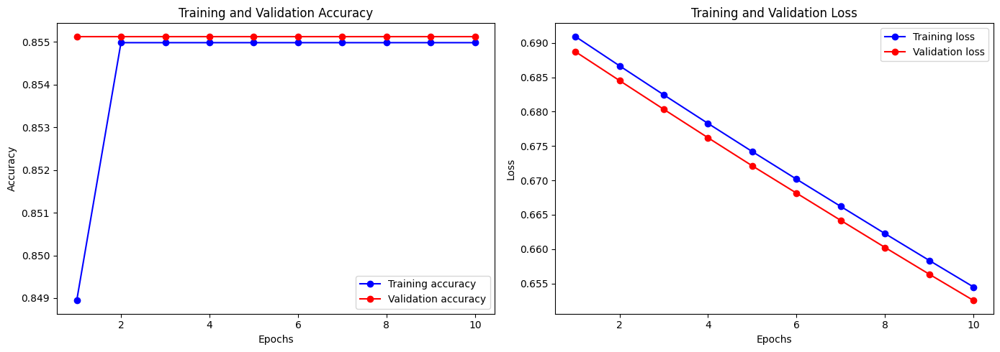

In [49]:
import matplotlib.pyplot as plt

# Extract the data from history object
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(accuracy) + 1)

# Plot training and validation accuracy
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, accuracy, 'bo-', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'ro-', label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(epochs, loss, 'bo-', label='Training loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


INFERENCE

In [59]:
def prepare_single_video(frames):
    frames = frames[None, ...]
    frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH, ),dtype="bool")
    frame_features = np.zeros(shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

    for i, batch in enumerate(frames):
        video_length = batch.shape[0]
        length = min(MAX_SEQ_LENGTH, video_length)
        for j in range(length):
            frame_features[i, j, :] = feature_extractor.predict(batch[None, j, :])
        frame_mask[i, :length] = 1 # 1 = not masked, 0 = masked

    return frame_features, frame_mask

def sequence_prediction(path):
    frames = load_video(os.path.join(DATA_FOLDER, TEST_FOLDER, path))
    frame_features, frame_mask = prepare_single_video(frames)
    return model.predict([frame_features, frame_mask])[0]

def to_gif(images):
    converted_images = images.astype(np.uint8)
    imageio.mimsave("animation.gif", converted_images, fps=10)
    return embed.embed_file("animation.gif")

test_video = np.random.choice(test_videos["video"].values.tolist())
print(f"Test video path: {test_video}")

if(sequence_prediction(test_video)>=0.5):
    print(f"The Prediction class of the video is FAKE")
else:
    print(f"The Prediction class of the video is REAL")

play_video(test_video, TEST_FOLDER)

Test video path: zrgrcpwvqa.mp4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
The Prediction class of the video is REAL


In [55]:
model.save(f"../../model/deepfake_video_model.keras")